## Step 1: Put all libraries and packages at top

### Built-in imports

In [1]:
# built-in imports
import os
import sys
import time
import random

### Standard imports

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# working with images
import cv2
import imageio as iio

# torch
import torch
import torch.nn as nn
import torch.nn.functional as F

# torchvision
import torchvision
import torchvision.transforms as transforms

# torchsummary
import torchsummary

# interactive progress bar
from tqdm import notebook

from IPython.display import clear_output

### Custom imports

In [3]:
sys.path.insert(0, '..')

# losses
from utils.metrics import iou_pytorch_eval, IoULoss, IoUBCELoss
from utils.metrics import iou_pytorch_test, dice_pytorch_test, precision_pytorch_test, recall_pytorch_test, fbeta_pytorch_test, accuracy_pytorch_test

# dataset
from utils.dataset import myDataSet

sys.path.insert(0, './notebooks')

In [5]:
sys.path.insert(0, '..')

# models
from models.unet import UNet, UNet_attention

sys.path.insert(0, './notebooks')

## Step 2: Fix a seed for reproducibility, and choose the DEVICE

In [6]:
random_seed= 42
random.seed(random_seed)
np.random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True

In [7]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu") # select device for training, i.e. gpu or cpu
print(DEVICE)

cuda


## Step 3: Evaluate validation performance (quantitative, full sized images)

### Load model

In [8]:
%ls ../checkpoints

README.md  ckpt_UNet_IoULoss_baseline.pth


In [10]:
# model_name = 'UNet_IoULoss_baseline'
# model_name = 'UNet_BCELoss_baseline'
# model_name = 'UNet_IoUBCELoss_baseline'
model_name = 'UNet_IoULoss_augmented'
# model_name = 'UNet_IoULoss_attention'


# submitted
# model_name = 'UNet_IoULoss_baseline_submitted'


# instansiate the model
if model_name == 'UNet_IoULoss_attention':
    model = UNet_attention(channel_in=3, channel_out=1)
else:
    model = UNet(channel_in=3, channel_out=1)

 # load model to DEVICE
model = model.to(DEVICE)

# load best weights and put into the evaluation mode
model.load_state_dict(torch.load(f'../checkpoints/ckpt_{model_name}.pth')['net'])

<All keys matched successfully>

### Print info and Plot learning curves:

In [11]:
history = torch.load(f'../checkpoints/ckpt_{model_name}.pth')

best_epoch = history['epoch']
best_iou = history['iou'].item()

print('Best epoch:', best_epoch)
print(f'Validation IoU:', best_iou)

Best epoch: 54
Validation IoU: 0.7030300498008728


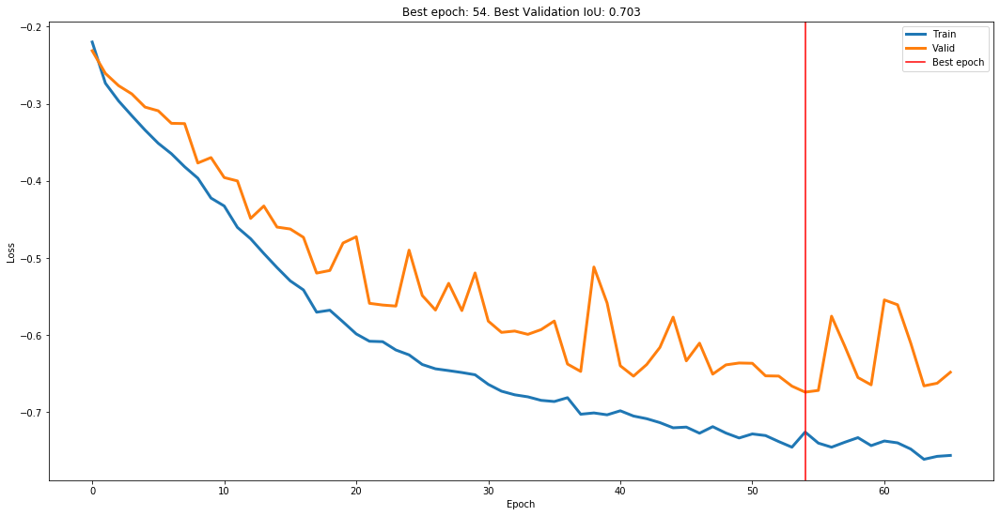

In [12]:
train_losses = history['train_losses']
val_losses = history['val_losses']

# plot
plt.figure(figsize=(18, 9))
plt.plot(np.arange(len(train_losses)), train_losses, label=f'Train', linewidth=3)
plt.plot(np.arange(len(val_losses)), val_losses, label=f'Valid', linewidth=3)
plt.axvline(x=best_epoch, label='Best epoch', color='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title(f'Best epoch: {best_epoch}. Best Validation IoU: {best_iou:.4}')
plt.legend(loc='best')

plt.savefig(f"../figures/learning_curves/{model_name}.svg")
plt.show()

### Produce predictions on Test Set

In [13]:
path_images = "../data/test/images"
    
_size = 256, 256
resize = transforms.Resize(_size, interpolation=0)

In [14]:
%mkdir ../predictions_test

mkdir: cannot create directory ‘../predictions_test’: File exists


In [15]:
PRED_PATH = '../predictions_test'
time_taken = []

model.eval() # enter inference/evaluation mode 
for name in notebook.tqdm(os.listdir(path_images)):
    path_img = os.path.join(path_images, name)
    img = iio.v3.imread(path_img) / 255

    
    # record shape to revert to 
    H, W, _ = img.shape
    resize_back = transforms.Resize((H, W), interpolation=0)
    
    # convert to Tensors and fix the dimentions (Pytorch uses the channels in the first dimension)
    img = torch.FloatTensor(np.transpose(img, [2, 0 ,1])).unsqueeze(0) 
    
    # resize for the model
    img = resize(img)
    
    # put on the GPU
    img = img.to(DEVICE)
    
    # we do not need to calculate gradients
    with torch.no_grad():
        # Start time
        start_time = time.time()
        ## Prediction
        pred = model(img)
        # End timer
        end_time = time.time() - start_time

    time_taken.append(end_time)
    #print("{} - {:.10f}".format(name, end_time))
        
    
    # resize back, nearest interpolation, since it's a mask
    pred = resize_back(pred)
    # put on cpu
    pred = pred.cpu()
    # remove channel => BATCH x H x W
    pred = pred.squeeze(0)

    
    # comment out if your model contains a sigmoid or equivalent activation layer
    pred = torch.sigmoid(pred)
    # thresholding since that's how we will make predictions on new imputs
    pred = pred > 0.5 
    # remove BATCH => H x W
    pred = pred.squeeze(0)
    # converto to correct type
    pred = pred.numpy().astype(np.float32)
    # revert to standard intensities
    pred = pred * 255.0
    # save
    pred_path = os.path.join(PRED_PATH, name)
    cv2.imwrite(pred_path, pred)


mean_time_taken = np.mean(time_taken)
mean_fps = 1/mean_time_taken
print("\nmean time taken: ", mean_time_taken)
print("Mean FPS: ", mean_fps)



mean time taken:  0.00402715802192688
Mean FPS:  248.31407025878974


## Step 5: Evaluate validation performance (visial, full sized images)

### Different cases

ckda5qdj900053a5sm6zg4bwb.jpg


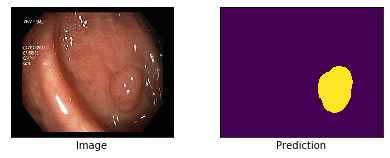

-------------------------------------------------------------------------------- 

ckda142i5000h3a5ssv9kauan.jpg


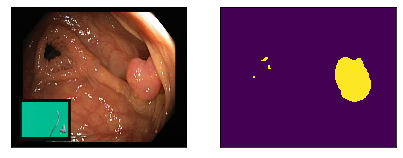

-------------------------------------------------------------------------------- 

ckdaa12yj000r3a5srr4ahcg2.jpg


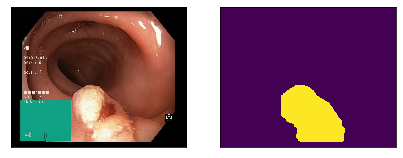

-------------------------------------------------------------------------------- 

ckcaidxum2xrf0y6g0329hw80.jpg


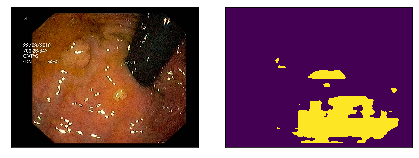

-------------------------------------------------------------------------------- 

ckda0kbde00083a5s2296juqy.jpg


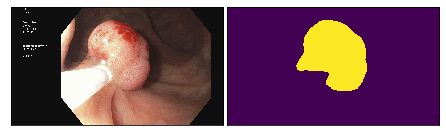

-------------------------------------------------------------------------------- 

ckda22o7b000v3a5s6zjzj7o3.jpg


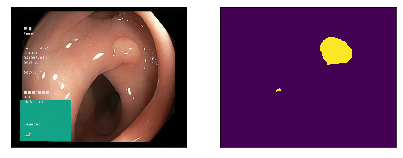

-------------------------------------------------------------------------------- 

ckda9x11x000h3a5st1g20mrf.jpg


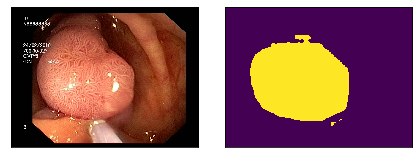

-------------------------------------------------------------------------------- 

ckda1jqsp000o3a5s5lh3pkdn.jpg


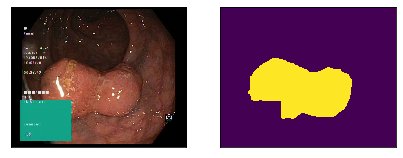

-------------------------------------------------------------------------------- 

ckcbqi8ry27wq0y7m7xqmecor.jpg


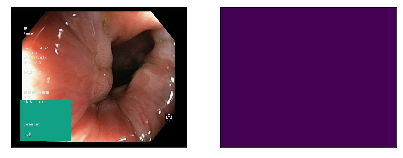

-------------------------------------------------------------------------------- 

ckd8sxdyn000a3b5sclphcakf.jpg


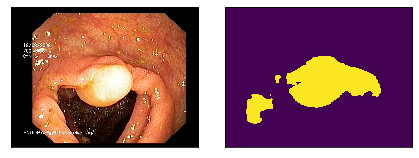

-------------------------------------------------------------------------------- 

ckdaa001p000n3a5shzakc3ar.jpg


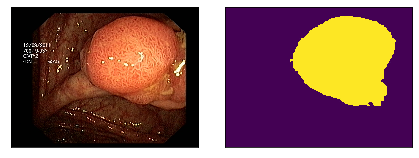

-------------------------------------------------------------------------------- 

ckcbpz4vz28i70y5p347j9b4a.jpg


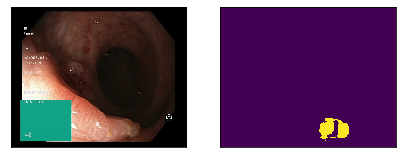

-------------------------------------------------------------------------------- 

ckda1ehes000j3a5sr74zgivg.jpg


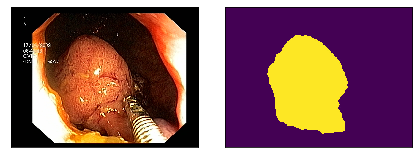

-------------------------------------------------------------------------------- 

ckcbpmwgb267j0y5pcv7404dq.jpg


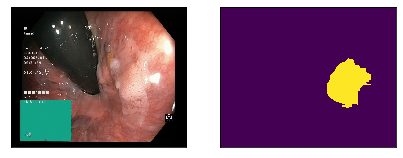

-------------------------------------------------------------------------------- 

ckda1j0sy000n3a5stotfjqpc.jpg


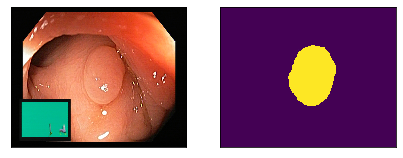

-------------------------------------------------------------------------------- 

ckcbsv8zd2i010y6g6te29eg7.jpg


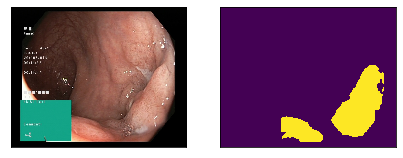

-------------------------------------------------------------------------------- 

ckcbt2pbv2ptl0y5p7xea6hg3.jpg


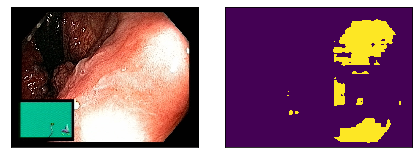

-------------------------------------------------------------------------------- 

ckcbm3tjn0dyu0y4h4kbld9ro.jpg


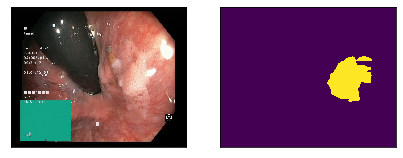

-------------------------------------------------------------------------------- 

ckdaa0oyd000q3a5sabbv22b0.jpg


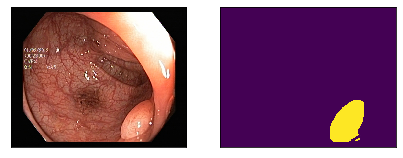

-------------------------------------------------------------------------------- 

ckcbqhgfw27qx0y7mbi0l9wn4.jpg


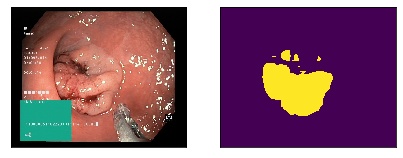

-------------------------------------------------------------------------------- 

ckcbswp262i6n0y6g2krjfhdb.jpg


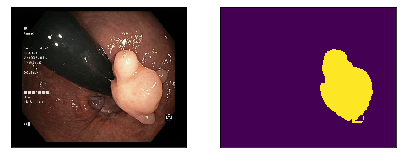

-------------------------------------------------------------------------------- 

ckcbt0asc2k520y5n4e5i8c9y.jpg


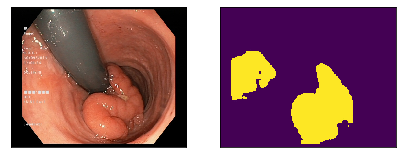

-------------------------------------------------------------------------------- 

ckda0hpik00053a5s3fiv5ry9.jpg


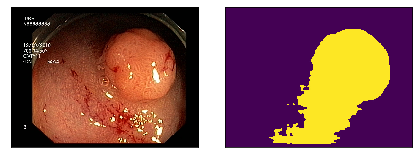

-------------------------------------------------------------------------------- 

ckda0qhcw000e3a5s654bhalg.jpg


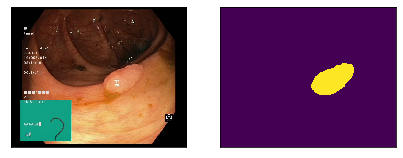

-------------------------------------------------------------------------------- 

ckda1yeh7000u3a5s37trez74.jpg


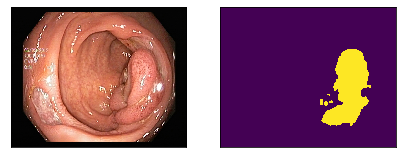

-------------------------------------------------------------------------------- 

ckda5xk19000f3a5s6rpp4xlq.jpg


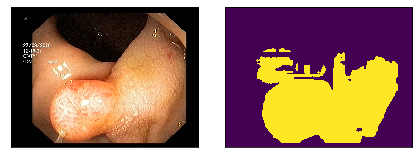

-------------------------------------------------------------------------------- 

ckda0i0f000063a5s28oczcwf.jpg


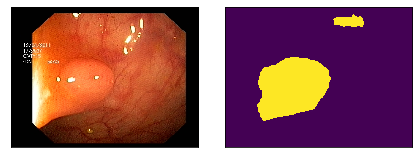

-------------------------------------------------------------------------------- 

ckcbqcksy2avk0y5p48zm1cyx.jpg


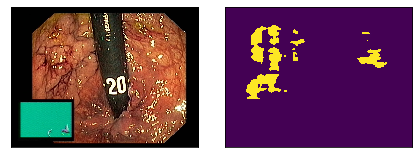

-------------------------------------------------------------------------------- 

ckd8u48vp000g3b5s3c55bvoj.jpg


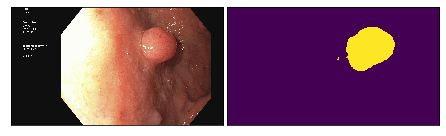

-------------------------------------------------------------------------------- 

ckcbltunv1g4g0y7m84o5fvix.jpg


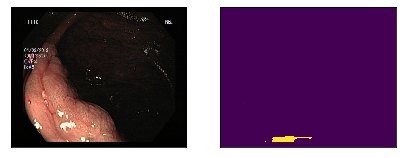

-------------------------------------------------------------------------------- 

ckcbqj0as28110y7meq1bhdw6.jpg


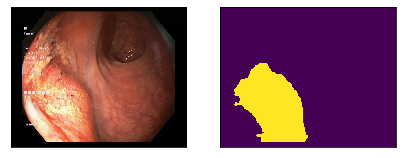

-------------------------------------------------------------------------------- 

ckcbpx29q242a0y7m3hmb7j8f.jpg


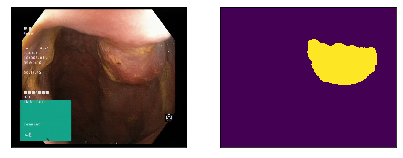

-------------------------------------------------------------------------------- 

ckd8u5qw3000i3b5sgzq7ce3l.jpg


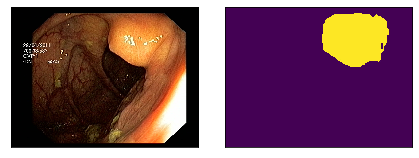

-------------------------------------------------------------------------------- 

ckda0e2zr00023a5sm4rhyu22.jpg


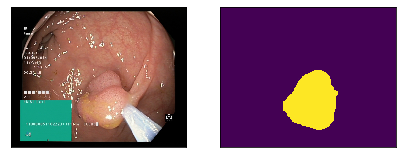

-------------------------------------------------------------------------------- 

ckcbqfw1224lo0y6g8zwq8w3j.jpg


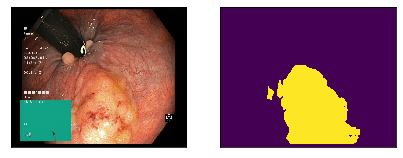

-------------------------------------------------------------------------------- 

ckcbm9wu21iag0y7m64rm6oz7.jpg


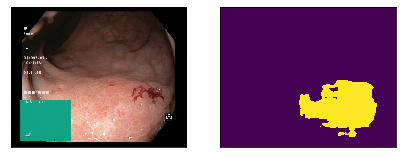

-------------------------------------------------------------------------------- 

ckda0guyf00043a5sru4xeu0y.jpg


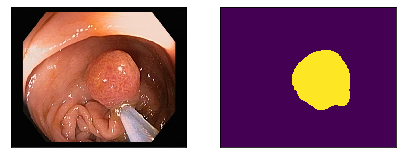

-------------------------------------------------------------------------------- 

ckcai75gy0rwm0y47f6zm6c4y.jpg


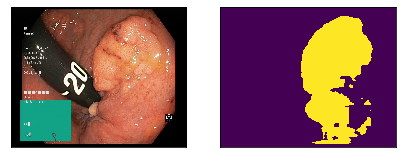

-------------------------------------------------------------------------------- 

ckcbm7flj1fid0y6gcsmoeipg.jpg


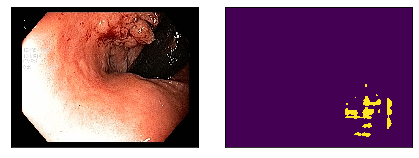

-------------------------------------------------------------------------------- 

ckcbkvuh01agn0y5n2sqs4vhy.jpg


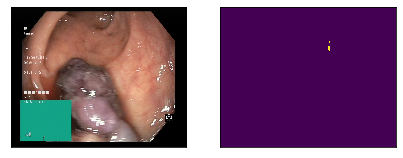

-------------------------------------------------------------------------------- 

ckda4xclk001a3a5svnxcascb.jpg


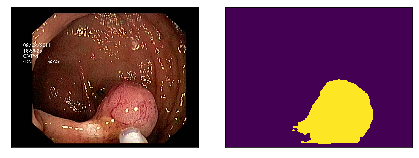

-------------------------------------------------------------------------------- 

ckd8rln2j00073b5s5t3jb0ef.jpg


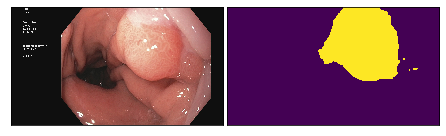

-------------------------------------------------------------------------------- 

ckd8rnczu00093b5s3nlrjr2p.jpg


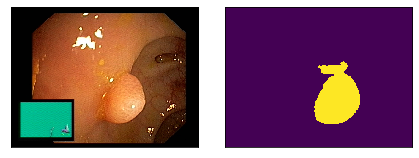

-------------------------------------------------------------------------------- 

ckcbstv7d0cu90z4hb04sb4ly.jpg


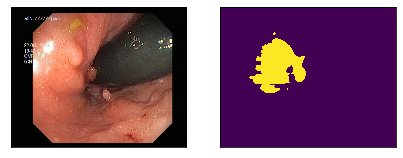

-------------------------------------------------------------------------------- 

ckda5xyr4000g3a5sc1dpzwya.jpg


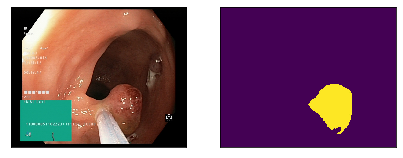

-------------------------------------------------------------------------------- 

ckd8u31cm000e3b5s3mbgboro.jpg


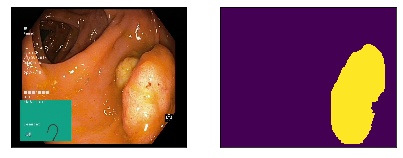

-------------------------------------------------------------------------------- 

ckda4t1yt00143a5sxkqz1pn7.jpg


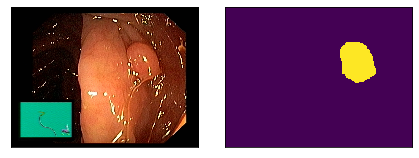

-------------------------------------------------------------------------------- 

ckd8tucza00033b5sm65huh8r.jpg


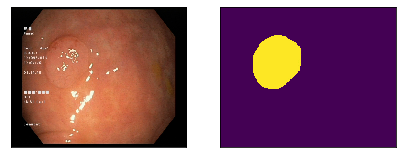

-------------------------------------------------------------------------------- 

ckcblygox1fjn0y5n4t9w76xr.jpg


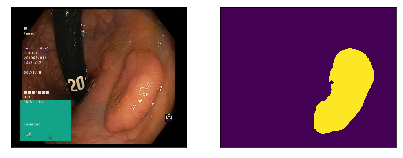

-------------------------------------------------------------------------------- 

ckcblngeo1jai0y5p6psactck.jpg


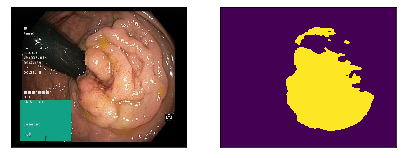

-------------------------------------------------------------------------------- 

ckda5tjlf00083a5ssc8d2wcx.jpg


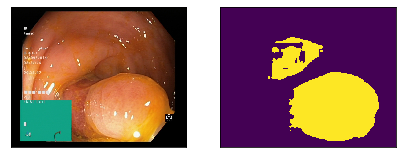

-------------------------------------------------------------------------------- 

ckdaa07mq000o3a5s2y4iufmb.jpg


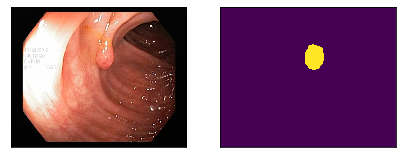

-------------------------------------------------------------------------------- 

ckcbqdu8g257l0y5nf7nrf23y.jpg


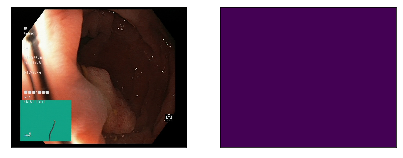

-------------------------------------------------------------------------------- 

ckcblv2mg0cnv0y6h6g71f1wm.jpg


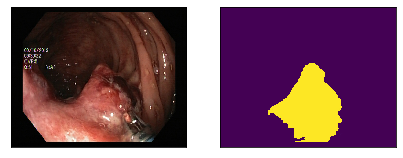

-------------------------------------------------------------------------------- 

ckda9yzdh000l3a5sacifrd8r.jpg


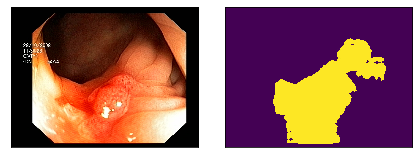

-------------------------------------------------------------------------------- 

ckcblfowe0abp0y4hf95z4q6o.jpg


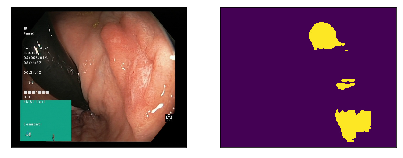

-------------------------------------------------------------------------------- 

ckda0d2uz00013a5s4m6o37c6.jpg


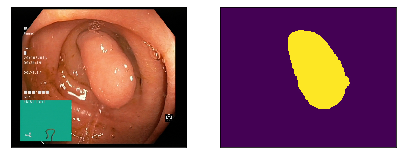

-------------------------------------------------------------------------------- 

ckd8tyc3z00093b5s2p9b0ges.jpg


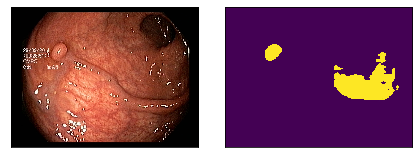

-------------------------------------------------------------------------------- 

ckdaa0faj000p3a5s5mw2smrd.jpg


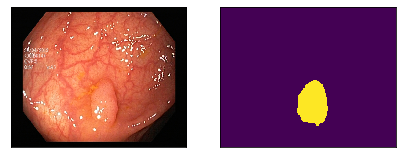

-------------------------------------------------------------------------------- 

ckd8synvm000d3b5shaneypja.jpg


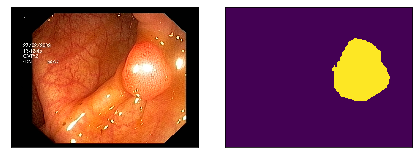

-------------------------------------------------------------------------------- 

ckda1ifr7000m3a5sgm7gf2kv.jpg


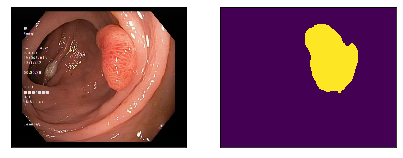

-------------------------------------------------------------------------------- 

ckd8tnm3g000h3b5s1rxnjsq3.jpg


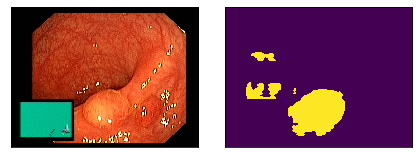

-------------------------------------------------------------------------------- 

ckcbq9p5c054t0y4h3w5n1f9g.jpg


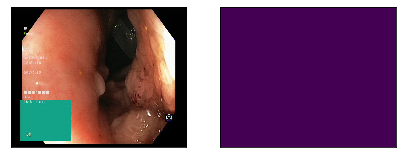

-------------------------------------------------------------------------------- 

ckd8sxr2u000b3b5ssko8d40l.jpg


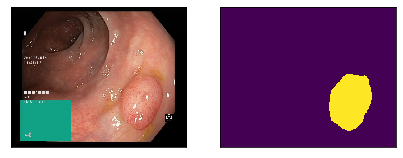

-------------------------------------------------------------------------------- 

ckda4okxk00103a5s2mfx4afr.jpg


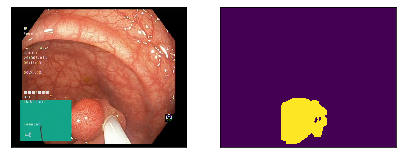

-------------------------------------------------------------------------------- 

ckda1tdd8000r3a5sx5xvm4kv.jpg


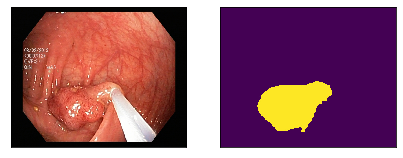

-------------------------------------------------------------------------------- 

ckd8tx25100073b5sn7cjx32x.jpg


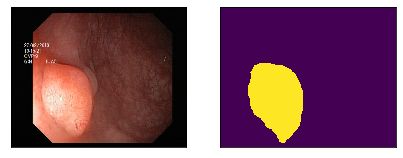

-------------------------------------------------------------------------------- 

ckd8strm900053b5srwqcah9s.jpg


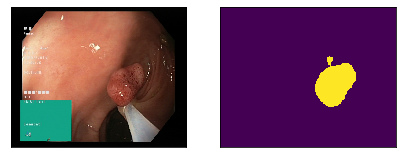

-------------------------------------------------------------------------------- 

ckda58aul00003a5spqcnvw7x.jpg


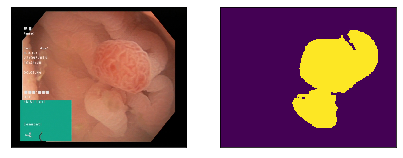

-------------------------------------------------------------------------------- 

ckda0rcqm000f3a5s36keoqwd.jpg


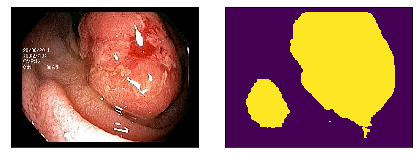

-------------------------------------------------------------------------------- 

ckd8rkeea00063b5segvd2va3.jpg


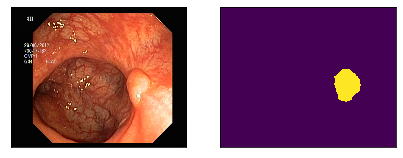

-------------------------------------------------------------------------------- 

ckd8tvw6j00053b5swagqipc1.jpg


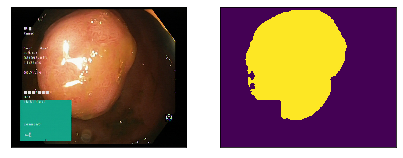

-------------------------------------------------------------------------------- 

ckcbkgdfw1djg0y5p7qu9bmcy.jpg


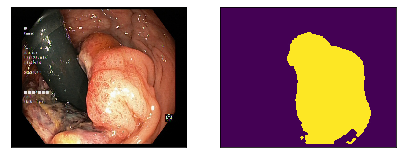

-------------------------------------------------------------------------------- 

ckda5q38x00043a5shgg1bffc.jpg


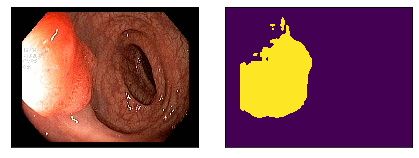

-------------------------------------------------------------------------------- 

ckd8u26a5000d3b5sa5f1vgiz.jpg


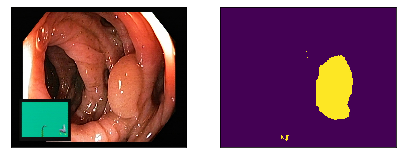

-------------------------------------------------------------------------------- 

ckd8tq1xr000j3b5s1kn6vx34.jpg


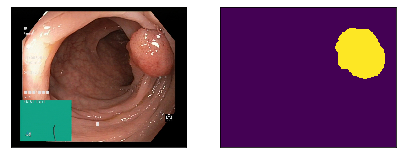

-------------------------------------------------------------------------------- 

ckd8sz9ut000e3b5s6vs09c0c.jpg


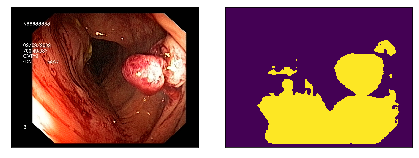

-------------------------------------------------------------------------------- 

ckda4l7w7000w3a5s16rryuzy.jpg


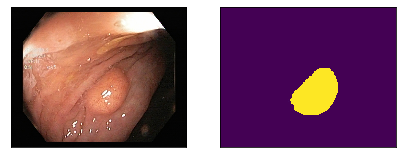

-------------------------------------------------------------------------------- 

ckd8swq2100093b5s1zjkgj4b.jpg


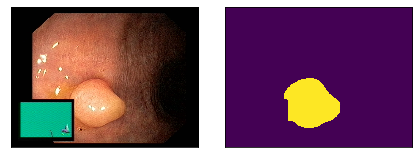

-------------------------------------------------------------------------------- 

ckd8u4ogu000h3b5s6m9nafxq.jpg


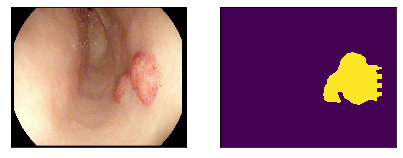

-------------------------------------------------------------------------------- 

ckd8toa0f000i3b5swbpasudq.jpg


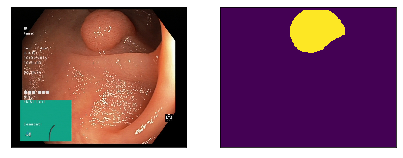

-------------------------------------------------------------------------------- 

ckd8tspte00003b5seb3ryptl.jpg


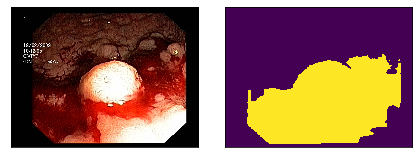

-------------------------------------------------------------------------------- 

ckcbqb2xc24oe0y5nedoo8uar.jpg


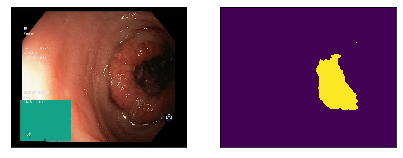

-------------------------------------------------------------------------------- 

ckda5i7zd00033a5se01mcaf3.jpg


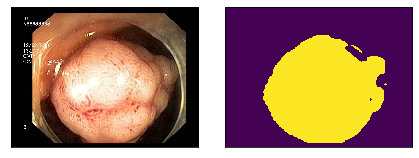

-------------------------------------------------------------------------------- 

ckda5v1qj000b3a5sk9jrmjh5.jpg


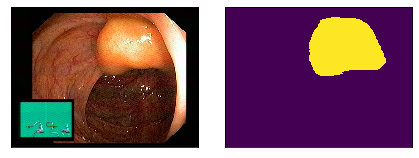

-------------------------------------------------------------------------------- 

ckd8ttzeo00023b5sfro24eom.jpg


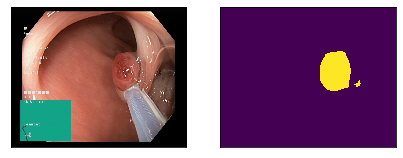

-------------------------------------------------------------------------------- 

ckd8tuxn000043b5s8bwtvcom.jpg


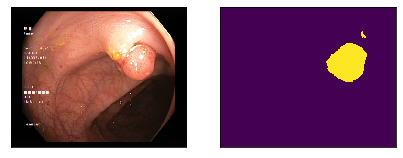

-------------------------------------------------------------------------------- 

ckda9xc7j000i3a5shbnuqx4l.jpg


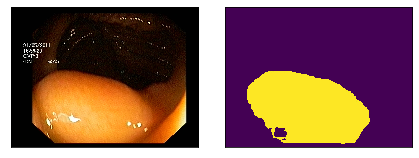

-------------------------------------------------------------------------------- 

ckda4vnv400173a5stmwdirfa.jpg


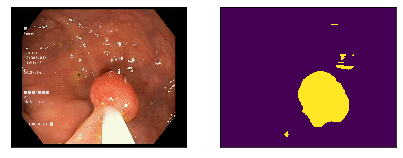

-------------------------------------------------------------------------------- 

ckd8u3pst000f3b5swm6cb3es.jpg


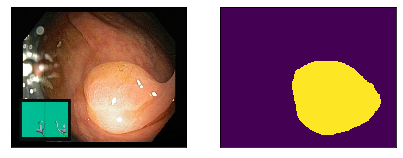

-------------------------------------------------------------------------------- 

ckda044sr00003a5s0u2f22il.jpg


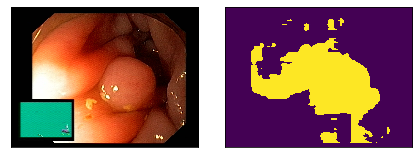

-------------------------------------------------------------------------------- 

ckd8sy9sg000c3b5sgrphj4u8.jpg


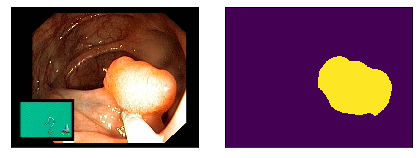

-------------------------------------------------------------------------------- 

ckcblrxjs1dbr0y6g0i0qgy3g.jpg


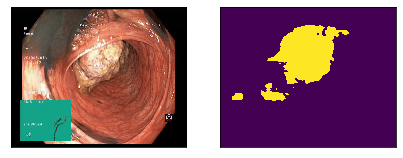

-------------------------------------------------------------------------------- 

ckcbkz2hz1avm0y5n69y6c3hc.jpg


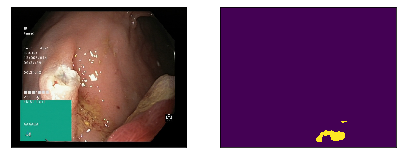

-------------------------------------------------------------------------------- 

ckcbprh7h270x0y5p615bdses.jpg


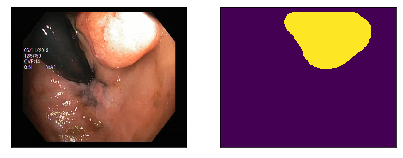

-------------------------------------------------------------------------------- 

ckcbpttsk024l0y4h6d443eg5.jpg


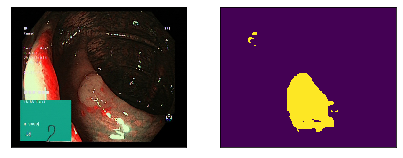

-------------------------------------------------------------------------------- 

ckcblq99h0bzq0y4hddj432v9.jpg


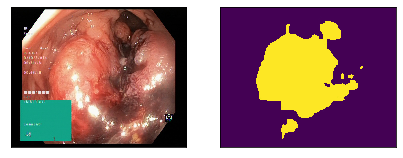

-------------------------------------------------------------------------------- 

ckcbpuklk27lh0y5p57ir7up6.jpg


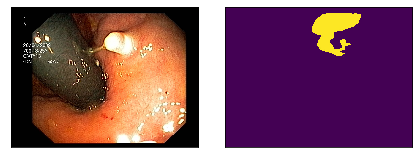

-------------------------------------------------------------------------------- 

ckd8u03ax000b3b5s6wlo2oa1.jpg


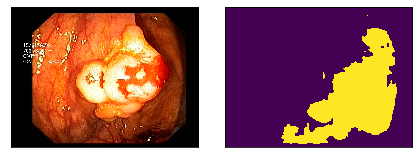

-------------------------------------------------------------------------------- 

ckcbt6mj60bap0y6h330q4c68.jpg


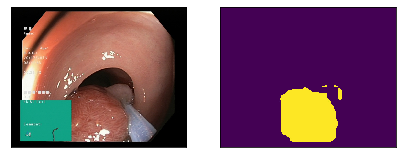

-------------------------------------------------------------------------------- 

ckdaa1wf9000s3a5sk52a8v3a.jpg


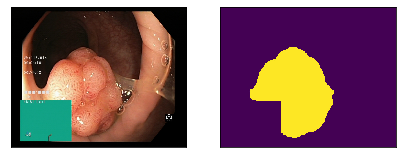

-------------------------------------------------------------------------------- 

ckda4psr900113a5s4wv12z5g.jpg


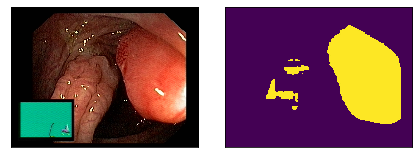

-------------------------------------------------------------------------------- 

ckda0l4kk000a3a5s3qh2vmjp.jpg


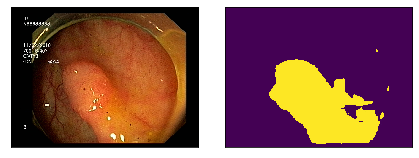

-------------------------------------------------------------------------------- 

ckda58hqd00013a5sfw1h65tx.jpg


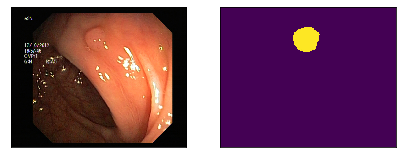

-------------------------------------------------------------------------------- 

ckda5gyul00023a5syjkqr1yc.jpg


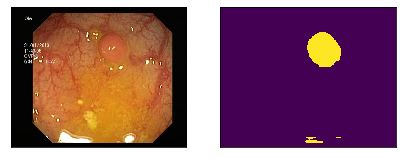

-------------------------------------------------------------------------------- 

ckd8tmpp3000g3b5scbgr51m8.jpg


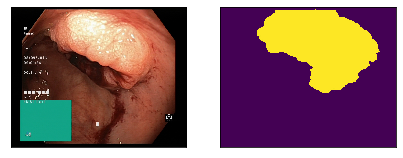

-------------------------------------------------------------------------------- 

ckcbt1akv0dxo0z4h394xb3l3.jpg


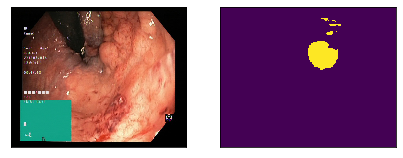

-------------------------------------------------------------------------------- 

ckd8sr33b00003b5sl6899a8l.jpg


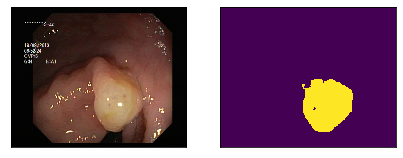

-------------------------------------------------------------------------------- 

ckcbq81iy240i0y5n8xiodmnm.jpg


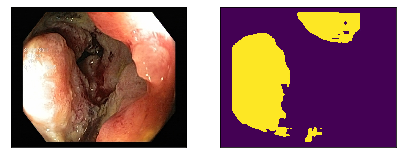

-------------------------------------------------------------------------------- 

ckcbq2a7722d90y6g4h9rd9gw.jpg


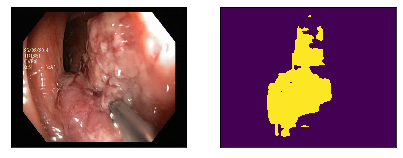

-------------------------------------------------------------------------------- 

ckd8stdnx00043b5sxun8ewkv.jpg


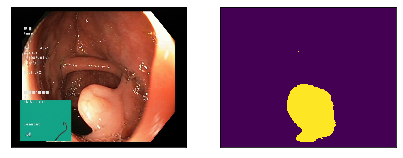

-------------------------------------------------------------------------------- 

ckcbm6dni1fcc0y6ggt5c7hlb.jpg


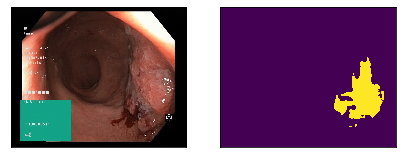

-------------------------------------------------------------------------------- 

ckcbpof9w1ztu0y6g66craon3.jpg


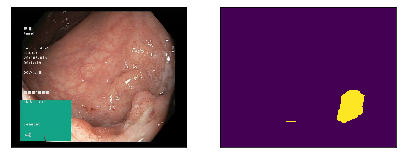

-------------------------------------------------------------------------------- 

ckda1xv1r000t3a5s3mw0kj98.jpg


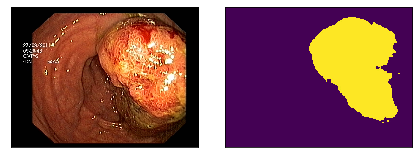

-------------------------------------------------------------------------------- 

ckcbsxxri0dhr0z4h3w6p9bxt.jpg


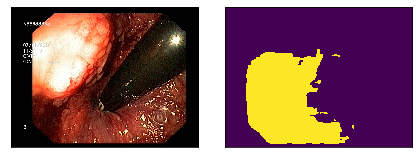

-------------------------------------------------------------------------------- 

ckcbpwbcz27y50y5p99aud939.jpg


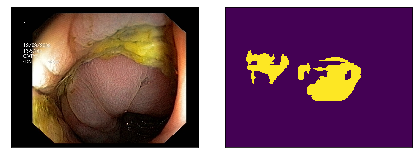

-------------------------------------------------------------------------------- 

ckda1ddcv000i3a5sl3k693l2.jpg


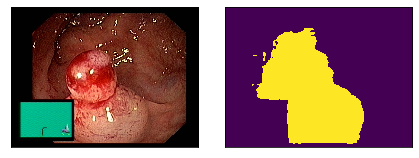

-------------------------------------------------------------------------------- 

ckda4xqus001b3a5s30zk3wci.jpg


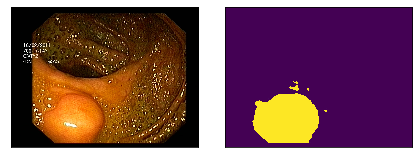

-------------------------------------------------------------------------------- 

ckd8rmjd700083b5sk7ajpzf6.jpg


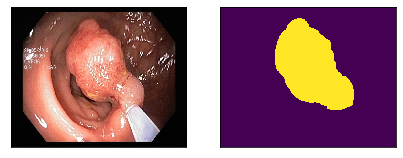

-------------------------------------------------------------------------------- 

ckcbsytaq0dm40z4hc7zx5s2p.jpg


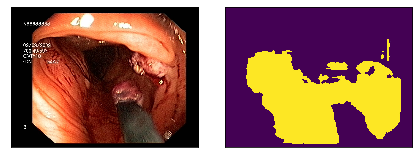

-------------------------------------------------------------------------------- 

ckda0punw000d3a5sfa07x5je.jpg


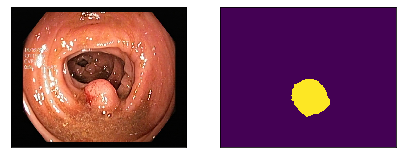

-------------------------------------------------------------------------------- 

ckda5wgcv000d3a5s3804l420.jpg


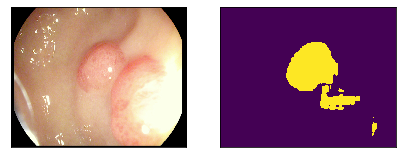

-------------------------------------------------------------------------------- 

ckda4s52800133a5s48fg91pt.jpg


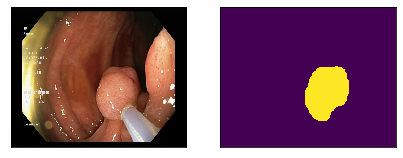

-------------------------------------------------------------------------------- 

ckda0ksgq00093a5se2y6g9h1.jpg


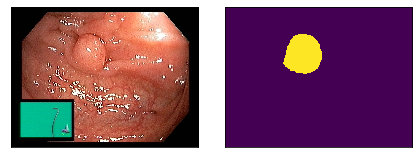

-------------------------------------------------------------------------------- 

ckcblj30z1ei40y7m1w963ryj.jpg


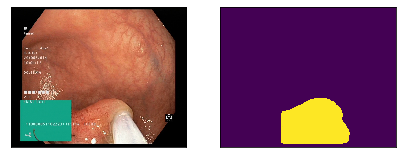

-------------------------------------------------------------------------------- 

ckda1fpc5000l3a5s17a45xql.jpg


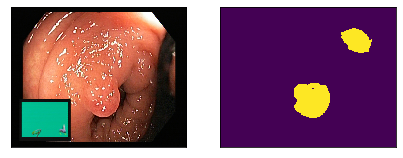

-------------------------------------------------------------------------------- 

ckd8txnqo00083b5spbqvehzd.jpg


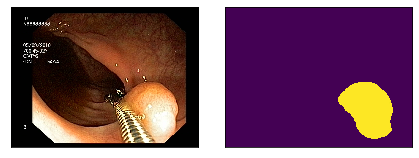

-------------------------------------------------------------------------------- 

ckd8ssoan00033b5sdjgxl66l.jpg


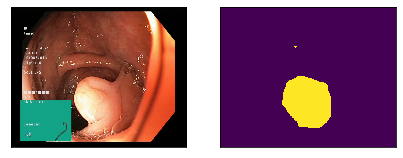

-------------------------------------------------------------------------------- 

ckcai9nma2xig0y6g595c7mtj.jpg


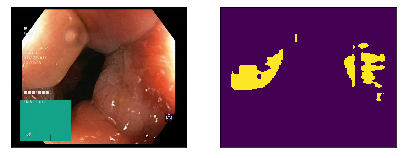

-------------------------------------------------------------------------------- 

ckcbpq9ck01im0y6haj4bca8h.jpg


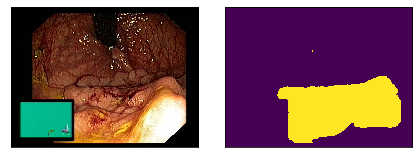

-------------------------------------------------------------------------------- 

ckda5txx200093a5s16i2y97u.jpg


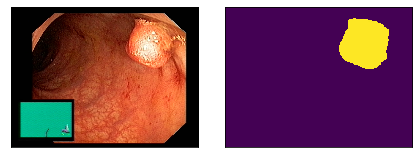

-------------------------------------------------------------------------------- 

ckd8u18d7000c3b5suod5aqf2.jpg


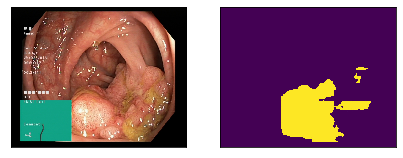

-------------------------------------------------------------------------------- 

ckda5rqvv00073a5sjxu7peen.jpg


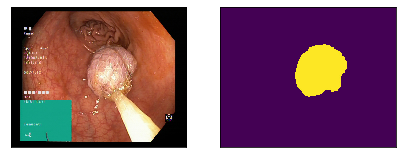

-------------------------------------------------------------------------------- 

ckda0j24m00073a5s1oruar1e.jpg


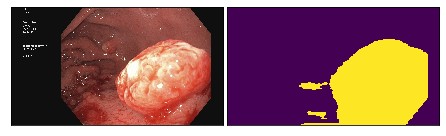

-------------------------------------------------------------------------------- 

ckda1x6ce000s3a5sb9h33n12.jpg


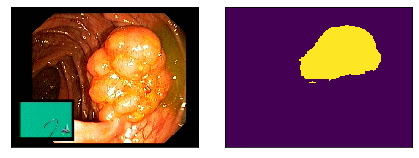

-------------------------------------------------------------------------------- 

ckcbkx23f1bvd0y7m823u8lb6.jpg


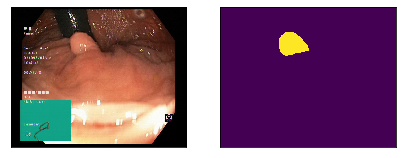

-------------------------------------------------------------------------------- 

ckcblwsw91koh0y5pe2pt84hl.jpg


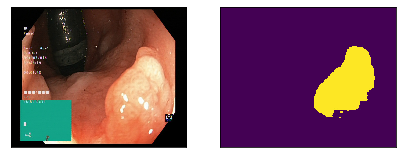

-------------------------------------------------------------------------------- 

ckda1f8q9000k3a5st2222ay7.jpg


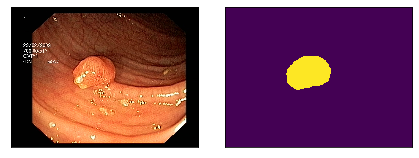

-------------------------------------------------------------------------------- 

ckd8srbmv00013b5sliek3ejo.jpg


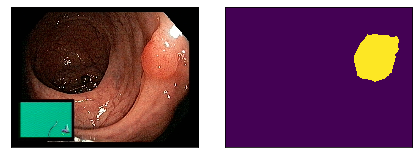

-------------------------------------------------------------------------------- 

ckcbt3uee2lwb0y7m5va0havv.jpg


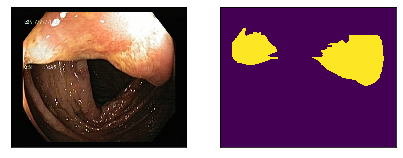

-------------------------------------------------------------------------------- 

ckda9y9dd000j3a5sii08df1n.jpg


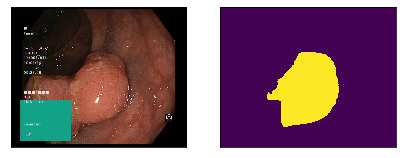

-------------------------------------------------------------------------------- 

ckda4r0w000123a5sp7v2iyem.jpg


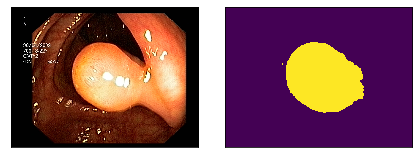

-------------------------------------------------------------------------------- 

ckd8sun6y00063b5swzdd3fd8.jpg


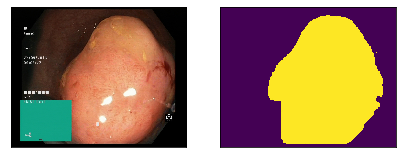

-------------------------------------------------------------------------------- 

ckda5wz53000e3a5s4v8to66t.jpg


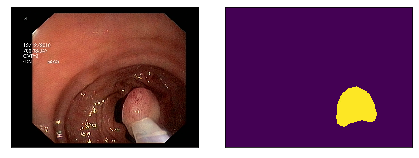

-------------------------------------------------------------------------------- 

ckcbt5sqf2kpw0y5nhh213g8i.jpg


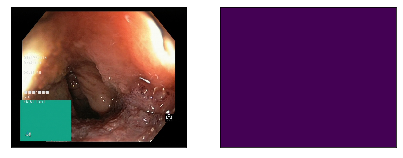

-------------------------------------------------------------------------------- 

ckd8swai400083b5sn1693d25.jpg


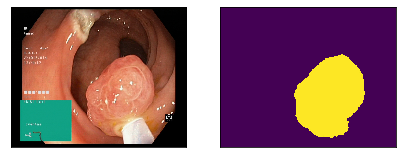

-------------------------------------------------------------------------------- 

ckcbq43s523fe0y5n126g6w5h.jpg


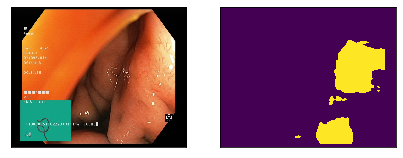

-------------------------------------------------------------------------------- 

ckd8sv8ds00073b5scw72l1dy.jpg


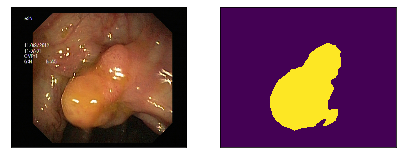

-------------------------------------------------------------------------------- 

ckda0seg1000g3a5s43lgah9e.jpg


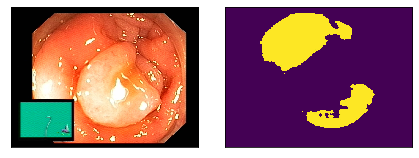

-------------------------------------------------------------------------------- 

ckda1spnc000q3a5srfxlvwce.jpg


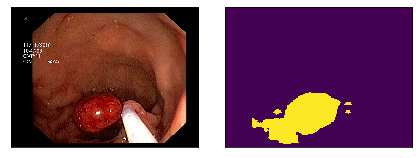

-------------------------------------------------------------------------------- 

ckd8ttjwc00013b5s33m1jgq2.jpg


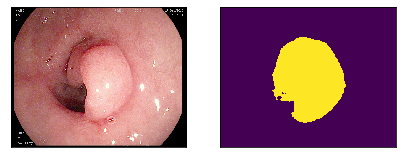

-------------------------------------------------------------------------------- 

ckcbq0gs703hv0y4h735ha581.jpg


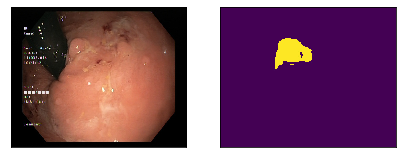

-------------------------------------------------------------------------------- 

ckda5ue81000a3a5sqapb5u41.jpg


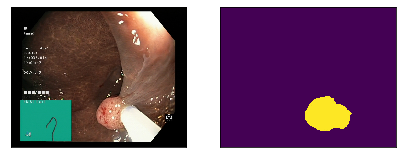

-------------------------------------------------------------------------------- 

ckda4mi4r000y3a5sln7mxclv.jpg


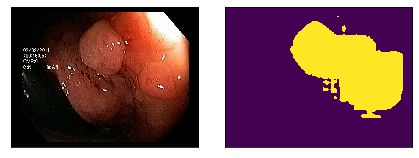

-------------------------------------------------------------------------------- 

ckda0oaty000c3a5sz6zigemv.jpg


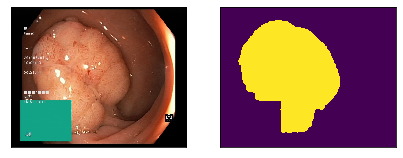

-------------------------------------------------------------------------------- 

ckd8twk1a00063b5slocqudcl.jpg


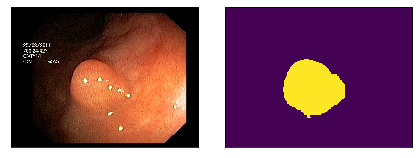

-------------------------------------------------------------------------------- 

ckcaibt572pxu0y6fazrxcc4f.jpg


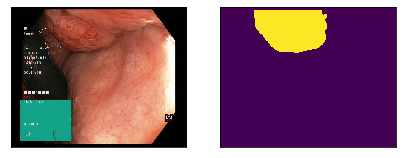

-------------------------------------------------------------------------------- 

ckda9yrip000k3a5sj7jkyh1q.jpg


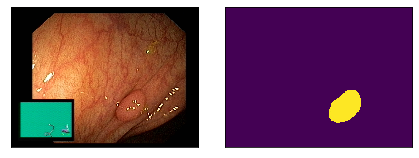

-------------------------------------------------------------------------------- 

ckda9zgi9000m3a5sof671qjh.jpg


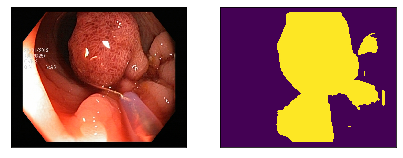

-------------------------------------------------------------------------------- 

ckd8srxq500023b5ssndncx7o.jpg


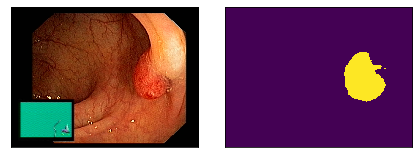

-------------------------------------------------------------------------------- 



In [16]:
#plt.figure(figsize=(15, 5))
total = 20

for i, name in enumerate(os.listdir(path_images)):
    print(name)
    plt.subplots(1, 2, sharex=True, sharey=True, figsize=(6, 2))
    
    plt.subplot(1,2,1)
    img = iio.v3.imread(f'{path_images}/{name}')
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    if i == 0:
        plt.xlabel('Image')
    
    plt.subplot(1,2,2)
    pred = iio.v3.imread(f'{PRED_PATH}/{name}')
    plt.imshow(pred)
    plt.xticks([])
    plt.yticks([])
    if i == 0:
        plt.xlabel('Prediction')
    

    plt.tight_layout(pad=0) # pad=0, w_pad=0, h_pad=0
    plt.show()
    
    print(80 * '-', '\n')

- fat: ckda9x11x000h3a5st1g20mrf.jpg
- medium: ckda1j0sy000n3a5stotfjqpc.jpg
- small: ckda0qhcw000e3a5s654bhalg.jpg
- very small: ckdaa07mq000o3a5s2y4iufmb.jpg

- flat: ckd8u18d7000c3b5suod5aqf2.jpg

In [17]:
different_polyp_names = ['ckda9x11x000h3a5st1g20mrf.jpg', 'ckda1j0sy000n3a5stotfjqpc.jpg', 'ckda0qhcw000e3a5s654bhalg.jpg', 'ckdaa07mq000o3a5s2y4iufmb.jpg', 'ckd8u18d7000c3b5suod5aqf2.jpg']

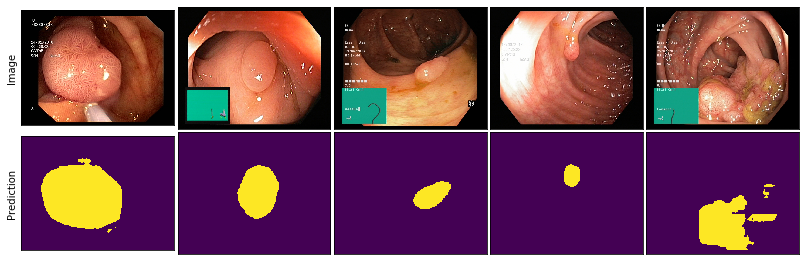

In [18]:
#plt.figure(figsize=(15, 5))
plt.subplots(2, 5, sharex=True, sharey=True, figsize=(11, 3.5))

for i, name in enumerate(different_polyp_names):
    
    plt.subplot(2,5,i+1)
    img = iio.v3.imread(f'{path_images}/{name}')
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    if i == 0:
        plt.ylabel('Image')
    
    plt.subplot(2,5,i+6)
    pred = iio.v3.imread(f'{PRED_PATH}/{name}')
    plt.imshow(pred)
    plt.xticks([])
    plt.yticks([])
    if i == 0:
        plt.ylabel('Prediction')
    
    #print(metrics_df.loc[name].round(3))
    #print(80 * '-')

plt.tight_layout(pad=0, w_pad=0, h_pad=0) # pad=0, w_pad=0, h_pad=0
#plt.savefig('../figures/validation_examples/different_polyps_img_mask_pred.svg')
plt.show()